In [248]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format

In [249]:
import pandas as pd
import math
import seaborn as sns
from matplotlib import pyplot as plt
import re
import numpy as np
import geopandas as gpd
from shapely.geometry import Point # Point class
from shapely.geometry import shape
import io
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
from geopy.geocoders import Nominatim
from time import sleep
from datetime import datetime

#  tahore, placer and El Dorado Location Data Pattern

In [250]:
# read the daily Volume
daily_volume=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/eco_daily_volume_2019_2016_data.csv')
daily_volume.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,Flag,date,days_in_month,no_of_days_data_collected
0,0,671,2016,1,1,Friday,53,56.00,24,56.00,24,night,0.00,day,56.00,0,0,2016-01-01,31,31
1,1,671,2016,1,2,Saturday,53,65.00,24,121.00,48,night,0.00,day,65.00,0,0,2016-01-02,31,31
2,2,671,2016,1,3,Sunday,53,60.00,24,181.00,72,night,2.00,day,58.00,0,0,2016-01-03,31,31
3,3,671,2016,1,4,Monday,1,12.00,24,193.00,96,night,0.00,day,12.00,0,0,2016-01-04,31,31
4,4,671,2016,1,5,Tuesday,1,18.00,24,211.00,120,night,6.00,day,12.00,0,0,2016-01-05,31,31


In [251]:
# bring the lat and long of the counters
loc=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/Eco_combined_data_rural_vs_urban_before_QA_QC.csv')
loc=loc.rename(columns={'location_x':'location'})
loc1=loc[['ID','year','latitude','longitude','location']]
loc2=loc1.drop_duplicates(subset=['ID','latitude','longitude'], keep='first')
loc2=loc2.loc[loc2['latitude']!=37.7792145070134]
loc2.shape

(417, 5)

In [252]:
# bring the location based on lat and long
def city_state_country(row):
    coord = f"{row['latitude']}, {row['longitude']}"
    sleep(1)
    location = geolocator.reverse(coord, exactly_one=True, language='en')
    if not location:
        # if you see many in a row, it's probably Nominatim blocking you.
        # if it's just every once in a while, there were just some bad results. 
        print('Failed with coord: ', coord)
        row['road'],row['city'],row['county'], row['state'], row['country'] = None, None, None
        return row
    address = location.raw['address']
    city = address.get('city', '')
    county=address.get('county', '')
    state = address.get('state', '')
    country = address.get('country', '')
    row['road']=address.get('road', '')
    row['city'] = city
    row['county'] = county
    row['state'] = state
    row['country'] = country
    return row

In [253]:
city_state1 = loc2.apply(city_state_country, axis=1)
city_state1.head()

,ID,year,latitude,longitude,location,road,city,county,state,country
0,671,2016,37.79,-122.46,urban,Bay Area Ridge Trail,San Francisco,,California,United States
35064,1127,2016,37.80,-122.42,urban,Broadway,San Francisco,,California,United States
70128,2415,2016,37.77,-122.44,urban,Fell Street,San Francisco,,California,United States
105192,2691,2016,35.29,-120.66,urban,Rail Road Safety Trail,San Luis Obispo,San Luis Obispo County,California,United States
140256,2692,2016,35.29,-120.66,urban,Rail Road Safety Trail,San Luis Obispo,San Luis Obispo County,California,United States


In [260]:
city_state1.groupby(['year','location'])['ID'].nunique()

year  location
2016  rural        29
      urban       388
Name: ID, dtype: int64

In [261]:
city_state1['city'].unique(),city_state1['county'].unique()

(array(['San Francisco', 'San Luis Obispo', '', 'Orange', 'Oakland',
        'Oceanside', 'Escondido', 'San Diego', 'Chula Vista', 'Vista',
        'El Cajon', 'Berkeley', 'Los Angeles', 'Costa Mesa', 'Anaheim',
        'Fremont', 'Irvine', 'San Rafael', 'Richmond', 'San Jose'],
       dtype=object),
 array(['', 'San Luis Obispo County', 'Orange County', 'Alameda County',
        'San Diego County', 'CAL Fire San Diego Unit', 'Marin County',
        'San Mateo County', 'Los Angeles County', 'Contra Costa County',
        'El Dorado County', 'Placer County', 'Washoe County',
        'Douglas County', 'Humboldt County', 'Fresno County',
        'Yolo County', 'Santa Clara County'], dtype=object))

In [262]:
# it seesm google nomination is pulling empty city for tahoe city, so use the adress to identify the tahoe location counter

In [263]:
rural=city_state1.loc[city_state1['location']=='rural']
rural

,ID,year,latitude,longitude,location,road,city,county,state,country
6662160,23303,2016,37.86,-122.57,rural,Dias Ridge Trail,,Marin County,California,United States
7433568,26339,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7468632,26340,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7854336,30661,2016,39.25,-119.95,rural,Tahoe Boulevard,,Washoe County,Nevada,United States
7889400,30664,2016,38.93,-120.03,rural,Emerald Bay Road,,El Dorado County,California,United States
7924464,30665,2016,38.98,-119.94,rural,Lam Watah Historic Trail,,Douglas County,Nevada,United States
7959528,30666,2016,39.09,-120.17,rural,Sacramento Avenue,,Placer County,California,United States
7994592,30667,2016,39.16,-120.16,rural,Truckee River Bike Trail,,Placer County,California,United States
8099784,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8345232,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [264]:
Tahoe_city_counter = city_state1[city_state1['road'].str.contains('Lake Tahoe Boulevard Bike Path', regex=False, case=False, na=False)]
Tahoe_city_counter

,ID,year,latitude,longitude,location,road,city,county,state,country
8099784,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8345232,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
10168560,47003,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
10799712,51027,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
10834776,51028,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [265]:
# lets plot the daily volume by dat for Tahoe city counter
tahoe_dv=pd.merge(daily_volume,Tahoe_city_counter, left_on=['ID','year'], right_on=['ID','year'], how='inner')
tahoe_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,days_in_month,no_of_days_data_collected,latitude,longitude,location,road,city,county,state,country
0,204976,51027,2016,12,1,Thursday,48,2.00,24,49.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
1,204977,51027,2016,12,2,Friday,48,3.00,24,52.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
2,204978,51027,2016,12,3,Saturday,48,4.00,24,56.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
3,204979,51027,2016,12,4,Sunday,48,7.00,24,63.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
4,204980,51027,2016,12,5,Monday,49,2.00,24,65.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
5,204981,51027,2016,12,6,Tuesday,49,2.00,24,67.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
6,204982,51027,2016,12,7,Wednesday,49,4.00,24,71.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
7,204983,51027,2016,12,8,Thursday,49,2.00,24,73.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8,204984,51027,2016,12,9,Friday,49,9.00,24,82.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
9,204985,51027,2016,12,11,Sunday,49,20.00,24,102.00,...,31,29,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [266]:
daily_volume.shape,tahoe_dv.shape

((206676, 20), (29, 28))

In [267]:
# Lets check with Placer County and El Dorado County
placer= city_state1[city_state1['county'].str.contains('Placer County', regex=False, case=False, na=False)]
El= city_state1[city_state1['county'].str.contains('El Dorado County', regex=False, case=False, na=False)]
El

,ID,year,latitude,longitude,location,road,city,county,state,country
7433568,26339,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7468632,26340,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7889400,30664,2016,38.93,-120.03,rural,Emerald Bay Road,,El Dorado County,California,United States
8029656,30669,2016,38.95,-119.96,urban,Lake Tahoe Boulevard,,El Dorado County,California,United States
8064720,30670,2016,38.93,-119.98,urban,El Dorado/ Harrison Bike,,El Dorado County,California,United States
8099784,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8134848,30672,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
8345232,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8380296,36077,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
8415360,36078,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States


In [268]:
placer_dv=pd.merge(daily_volume,placer, left_on=['ID','year'], right_on=['ID','year'], how='inner')
placer_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,days_in_month,no_of_days_data_collected,latitude,longitude,location,road,city,county,state,country


In [269]:
# it seems none of eco counter was qualified to be permanent counter according to hour QA and QC

In [270]:
El_dv=pd.merge(daily_volume,El, left_on=['ID','year'], right_on=['ID','year'], how='inner')
El_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,days_in_month,no_of_days_data_collected,latitude,longitude,location,road,city,county,state,country
0,202716,49628,2016,12,1,Thursday,48,5.00,24,32.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
1,202717,49628,2016,12,2,Friday,48,1.00,24,33.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
2,202718,49628,2016,12,3,Saturday,48,4.00,24,37.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
3,202719,49628,2016,12,4,Sunday,48,4.00,24,41.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
4,202720,49628,2016,12,5,Monday,49,4.00,24,45.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
5,202721,49628,2016,12,7,Wednesday,49,1.00,24,49.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
6,202722,49628,2016,12,9,Friday,49,6.00,24,55.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
7,202723,49628,2016,12,11,Sunday,49,9.00,24,64.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
8,202724,49628,2016,12,12,Monday,50,8.00,24,72.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
9,202725,49628,2016,12,13,Tuesday,50,6.00,24,78.00,...,31,27,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States


In [271]:
El_dv.shape

(56, 28)

In [272]:
# so, all Tahoe, placer and El Dorado County does not have enough data to check the seasonality, it seems most of the data is zero which was excluded in QA and QC process

In [273]:
# we will check the raw volume before major QA and QC to check the data
daily_vol6=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/eco_daily_raw_volume.csv')
daily_vol6['date']=pd.to_datetime(daily_vol6.year*10000+daily_vol6.month*100+daily_vol6.day,format='%Y%m%d')
daily_vol6['dayofyear'] = daily_vol6['date'].dt.dayofyear
# check Tahore City before QA and QC
mask = daily_vol6['ID'].isin(list(Tahoe_city_counter['ID']))
tahoe=daily_vol6.loc[mask]
tahoe.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
333215,333215,30671,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
333216,333216,30671,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
333217,333217,30671,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
333218,333218,30671,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
333219,333219,30671,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [274]:
check=tahoe.loc[tahoe['Daily_volume']>0]
check.groupby(['ID','year'])['ID'].count()

ID     year
36076  2017      2
47003  2018     36
51027  2016     37
       2017    328
       2018    304
       2019    297
51028  2018     36
Name: ID, dtype: int64

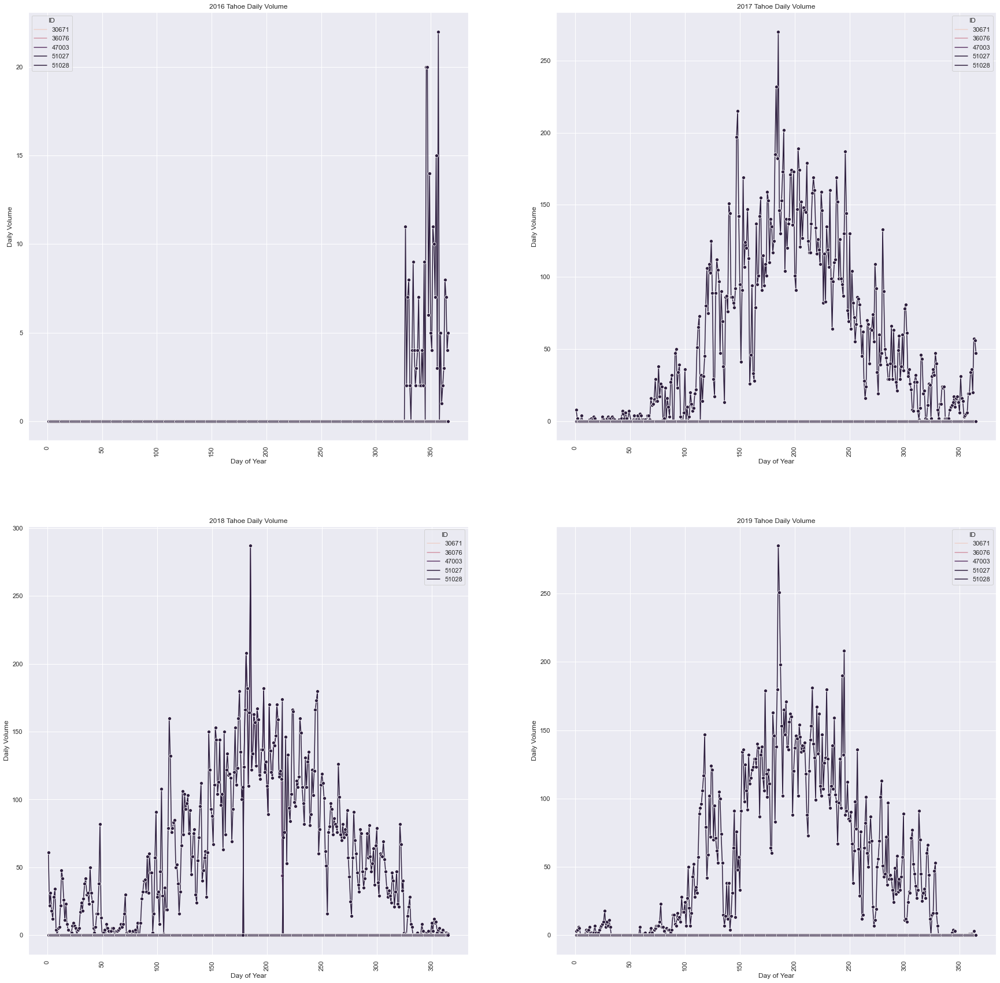

In [275]:
# lets plot
d16=tahoe.loc[tahoe['year']==2016]
d17=tahoe.loc[tahoe['year']==2017]
d18=tahoe.loc[tahoe['year']==2018]
d19=tahoe.loc[tahoe['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=1.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Tahoe Daily Volume')
ax2.title.set_text('2017 Tahoe Daily Volume')
ax3.title.set_text('2018 Tahoe Daily Volume')
ax4.title.set_text('2019 Tahoe Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

In [276]:
# Check the Placer County Data Pattern
# check Tahore City before QA and QC
pmask = daily_vol6['ID'].isin(list(placer['ID']))
placer_county=daily_vol6.loc[pmask]
placer_county.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
321541,321541,30660,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
321542,321542,30660,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
321543,321543,30660,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
321544,321544,30660,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
321545,321545,30660,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [277]:
pcheck=placer_county.loc[placer_county['Daily_volume']>0]
pcheck.groupby(['ID','year'])['ID'].count()

ID     year
30660  2017      8
       2019      8
30666  2017    163
       2018    230
       2019    208
30667  2018     47
       2019     95
38912  2017      7
39870  2017      5
39871  2017      4
39872  2017      7
       2019      7
39873  2017      1
39874  2017      1
49606  2018      7
       2019    225
50998  2019      2
51661  2019     45
52194  2018     47
       2019    247
53638  2019      2
Name: ID, dtype: int64

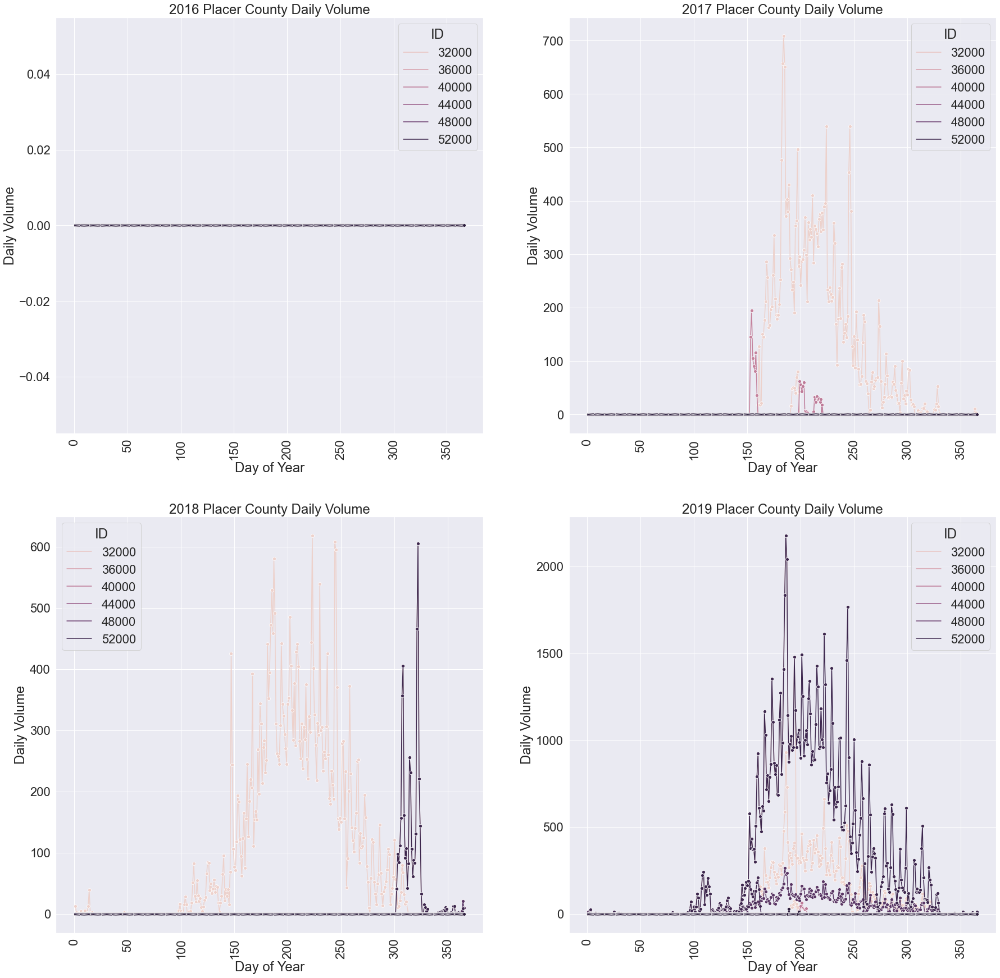

In [278]:
# lets plot
d16=placer_county.loc[placer_county['year']==2016]
d17=placer_county.loc[placer_county['year']==2017]
d18=placer_county.loc[placer_county['year']==2018]
d19=placer_county.loc[placer_county['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Placer County Daily Volume')
ax2.title.set_text('2017 Placer County Daily Volume')
ax3.title.set_text('2018 Placer County Daily Volume')
ax4.title.set_text('2019 Placer County Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

In [279]:
# check the data pattern for El Dorado County
emask = daily_vol6['ID'].isin(list(El['ID']))
El_county=daily_vol6.loc[emask]
El_county.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
305478,305478,26339,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
305479,305479,26339,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
305480,305480,26339,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
305481,305481,26339,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
305482,305482,26339,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [280]:
echeck=El_county.loc[El_county['Daily_volume']>0]
echeck.groupby(['ID','year'])['ID'].count()

ID     year
30664  2017    204
       2018    287
       2019    244
30669  2017      1
30670  2017      1
36076  2017      2
36077  2017      1
36078  2017      3
36730  2017      1
36731  2017     10
46602  2018     10
46622  2018      7
46886  2018     12
47003  2018     36
47311  2018      7
47312  2018     12
49554  2018      1
49555  2018      2
49628  2016     33
       2017    315
       2018    302
       2019    255
50992  2017     70
       2018    353
       2019    217
50993  2017     56
       2018    324
       2019    292
50994  2019      9
50996  2019     13
50997  2019      9
51027  2016     37
       2017    328
       2018    304
       2019    297
51028  2018     36
51029  2017      3
51030  2018      7
51031  2018      1
53637  2019      1
58246  2019    112
58297  2019     31
58298  2019     31
Name: ID, dtype: int64

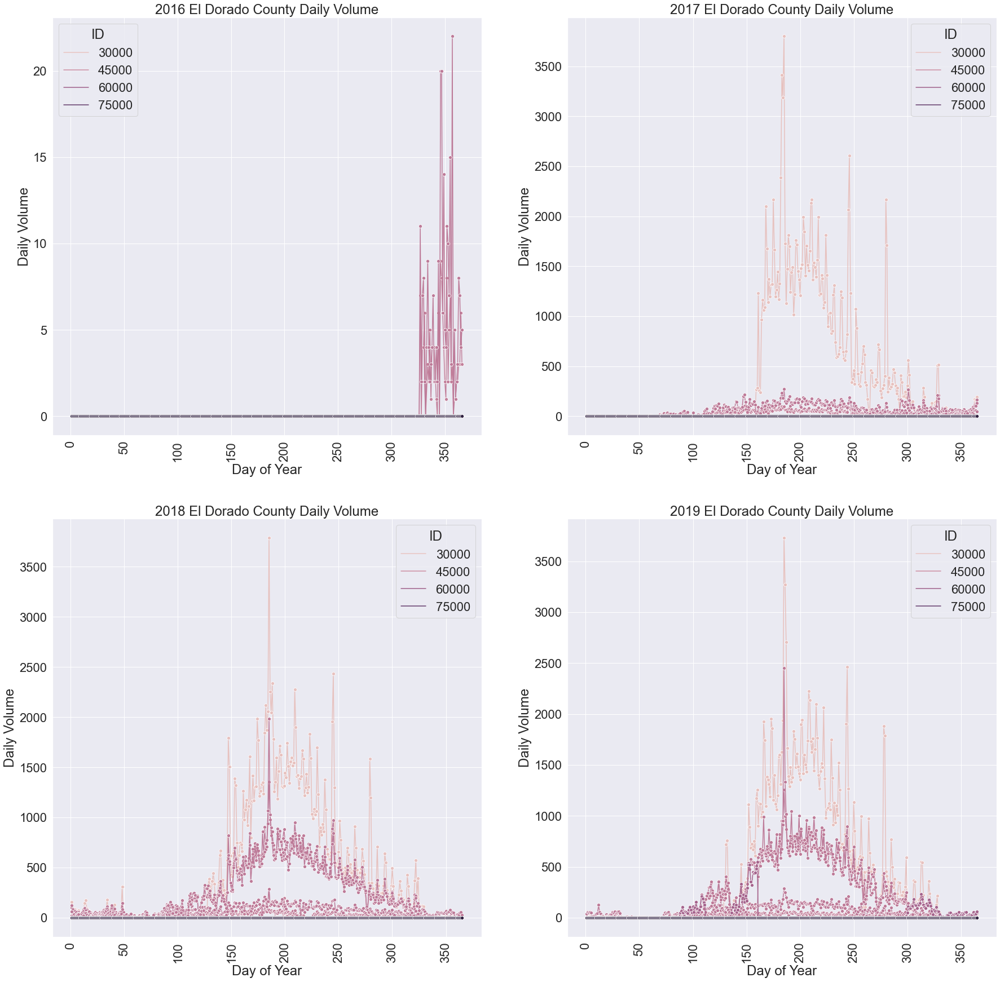

In [281]:
# lets plot
d16=El_county.loc[El_county['year']==2016]
d17=El_county.loc[El_county['year']==2017]
d18=El_county.loc[El_county['year']==2018]
d19=El_county.loc[El_county['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 El Dorado County Daily Volume')
ax2.title.set_text('2017 El Dorado County Daily Volume')
ax3.title.set_text('2018 El Dorado County Daily Volume')
ax4.title.set_text('2019 El Dorado County Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

# HOD Factor

In [282]:
# read hourly volume
hr_vol2=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/eco_hourly_clean_volume.csv')
# read permanent counters data afte QA and QC check
Permanent_counter=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/permanent_counter_2019_2016_AADBT_data.csv')
doh=pd.merge(hr_vol2,Permanent_counter,left_on=['ID','year'],right_on=['ID','year'],how='inner')

In [283]:
doh_weekday=doh.loc[doh['Week Day Status']=='Week Day']
doh_weekend=doh.loc[doh['Week Day Status']=='Weekend']
doh_weekend.head()

,Unnamed: 0_x,index,ID,year,month,day,weekno,dayofweek,weekday_Status,starttime,...,location_x,location_y,Flag,Unnamed: 0_y,location,latitude_y,longitude_y,ATT,no_of_months_data_collected,type
1,31,31,671,2016,1,2,53,5,1,07:00:00,...,urban,urban,0,0,urban,37.79,-122.46,19573.00,12,eco_permanent
2,55,55,671,2016,1,3,53,6,1,07:00:00,...,urban,urban,0,0,urban,37.79,-122.46,19573.00,12,eco_permanent
8,199,199,671,2016,1,9,1,5,1,07:00:00,...,urban,urban,0,0,urban,37.79,-122.46,19573.00,12,eco_permanent
9,223,223,671,2016,1,10,1,6,1,07:00:00,...,urban,urban,0,0,urban,37.79,-122.46,19573.00,12,eco_permanent
15,367,367,671,2016,1,16,2,5,1,07:00:00,...,urban,urban,0,0,urban,37.79,-122.46,19573.00,12,eco_permanent


In [284]:
doh.groupby(['location'])['ID'].nunique()

location
rural     12
urban    203
Name: ID, dtype: int64

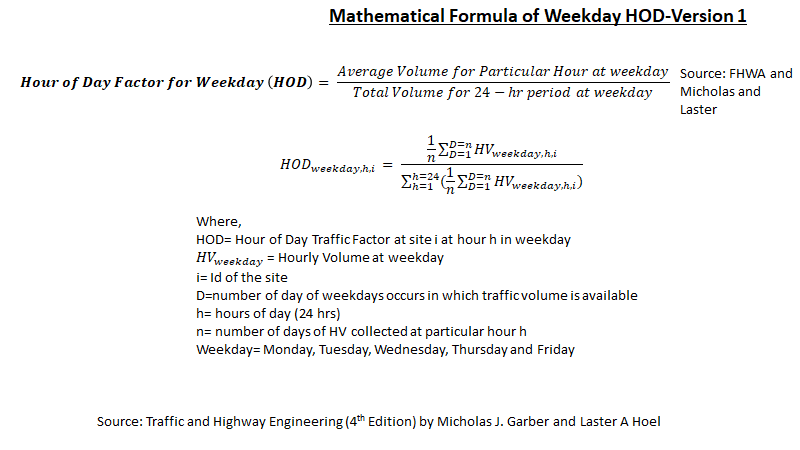

In [285]:
hod_weekday=pd.DataFrame({'Average_HOD':doh_weekday.groupby(['ID','year','starttime'])['counts'].mean()}).reset_index()
hod_weekday1=pd.DataFrame({'sum of Average_HOD':hod_weekday.groupby(['ID','year'])['Average_HOD'].sum()}).reset_index()
hod_weekday2=pd.merge(hod_weekday,hod_weekday1,left_on=['ID','year'],right_on=['ID','year'],how='inner')
hod_weekday2['HOD']=hod_weekday2['Average_HOD']/hod_weekday2['sum of Average_HOD']
hod_weekday2.head()

,ID,year,starttime,Average_HOD,sum of Average_HOD,HOD
0,671,2016,00:00:00,0.02,43.60,0.00
1,671,2016,01:00:00,0.01,43.60,0.00
2,671,2016,02:00:00,0.00,43.60,0.00
3,671,2016,03:00:00,0.00,43.60,0.00
4,671,2016,04:00:00,0.00,43.60,0.00


In [286]:
# just check the second version if it works different way. It actuallt give wrong factor, we will use the previous one
hod_weekday1=pd.DataFrame({'Average_HOD':doh_weekday.groupby(['ID','year','starttime'])['counts'].mean()}).reset_index()
hod_weekday11=pd.DataFrame({'Total_HOD':doh_weekday.groupby(['ID','year','starttime'])['counts'].sum()}).reset_index()
hod_weekdayv1=pd.DataFrame({'sum of Average_HOD':hod_weekday11.groupby(['ID','year'])['Total_HOD'].mean()}).reset_index()
hod_weekdayv2=pd.merge(hod_weekday1,hod_weekdayv1,left_on=['ID','year'],right_on=['ID','year'],how='inner')
hod_weekdayv2['HOD_v2']=hod_weekdayv2['Average_HOD']/hod_weekdayv2['sum of Average_HOD']
hod_weekdayv2.head()

,ID,year,starttime,Average_HOD,sum of Average_HOD,HOD_v2
0,671,2016,00:00:00,0.02,474.17,0.00
1,671,2016,01:00:00,0.01,474.17,0.00
2,671,2016,02:00:00,0.00,474.17,0.00
3,671,2016,03:00:00,0.00,474.17,0.00
4,671,2016,04:00:00,0.00,474.17,0.00


In [287]:
hod_weekday2.groupby(['ID','year'])['HOD'].sum()

ID     year
671    2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
1127   2016   1.00
              ... 
59065  2018   1.00
59066  2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
Name: HOD, Length: 695, dtype: float64

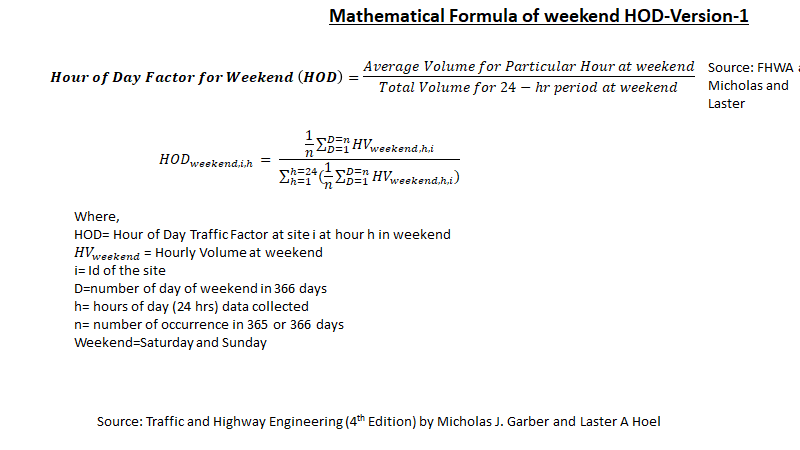

In [288]:
hod_weekend=pd.DataFrame({'Average_HOD':doh_weekend.groupby(['ID','year','starttime'])['counts'].mean()}).reset_index()
hod_weekend1=pd.DataFrame({'sum of Average_HOD':hod_weekend.groupby(['ID','year'])['Average_HOD'].sum()}).reset_index()
hod_weekend2=pd.merge(hod_weekend,hod_weekend1,left_on=['ID','year'],right_on=['ID','year'],how='inner')
hod_weekend2['HOD']=hod_weekend2['Average_HOD']/hod_weekend2['sum of Average_HOD']
hod_weekend2.head()

,ID,year,starttime,Average_HOD,sum of Average_HOD,HOD
0,671,2016,00:00:00,0.06,78.03,0.00
1,671,2016,01:00:00,0.01,78.03,0.00
2,671,2016,02:00:00,0.00,78.03,0.00
3,671,2016,03:00:00,0.03,78.03,0.00
4,671,2016,04:00:00,0.00,78.03,0.00


In [289]:
hod_weekday2.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/HOD_weekday.csv')
hod_weekend2.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/HOD_weekend.csv')

In [290]:
hod_weekend2.groupby(['ID','year'])['HOD'].sum()

ID     year
671    2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
1127   2016   1.00
              ... 
59065  2018   1.00
59066  2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
Name: HOD, Length: 695, dtype: float64

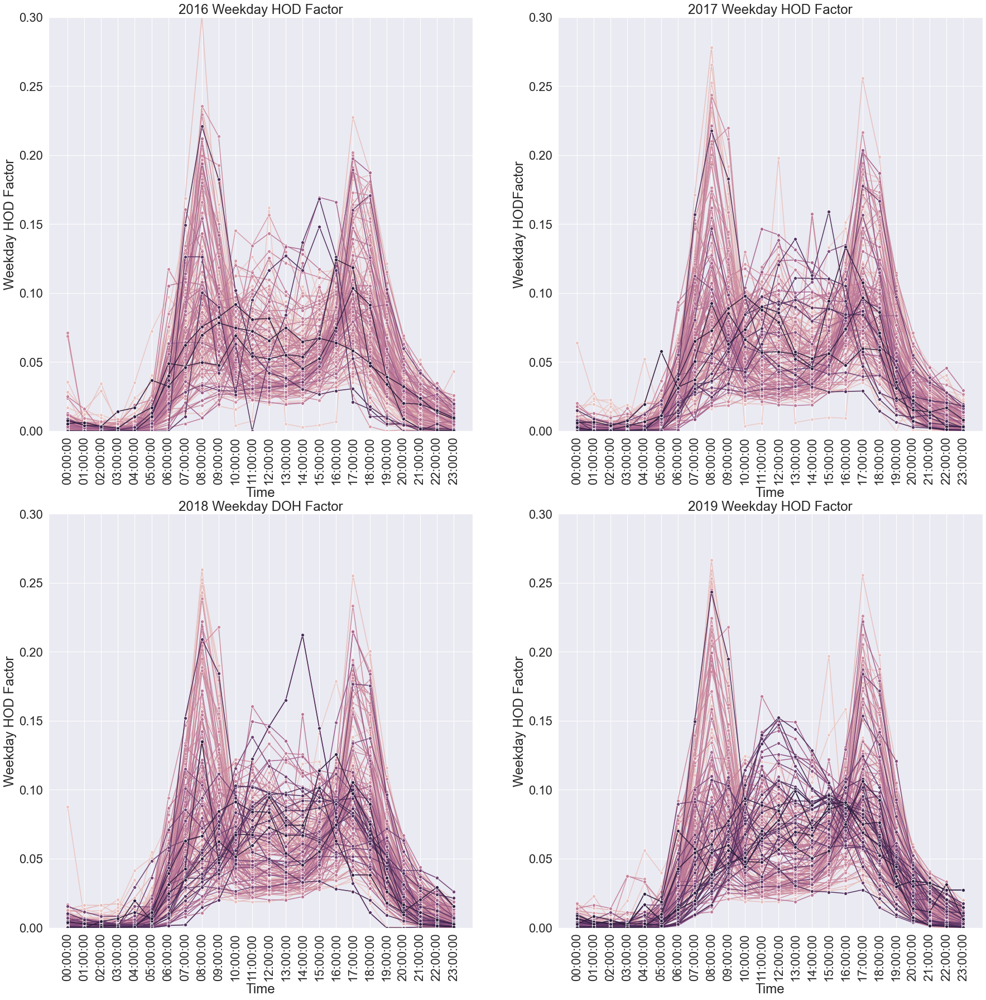

In [291]:
d16=hod_weekday2.loc[hod_weekday2['year']==2016]
d17=hod_weekday2.loc[hod_weekday2['year']==2017]
d18=hod_weekday2.loc[hod_weekday2['year']==2018]
d19=hod_weekday2.loc[hod_weekday2['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['HOD'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['HOD'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['HOD'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['HOD'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.set(ylim=(0, 0.30))
ax2.set(ylim=(0, 0.30))
ax3.set(ylim=(0, 0.30))
ax4.set(ylim=(0, 0.30))
ax1.title.set_text('2016 Weekday HOD Factor')
ax2.title.set_text('2017 Weekday HOD Factor')
ax3.title.set_text('2018 Weekday DOH Factor')
ax4.title.set_text('2019 Weekday HOD Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Weekday HOD Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Weekday HODFactor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Weekday HOD Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Weekday HOD Factor' )
ax4.set_xlabel('Time')
plt.show()

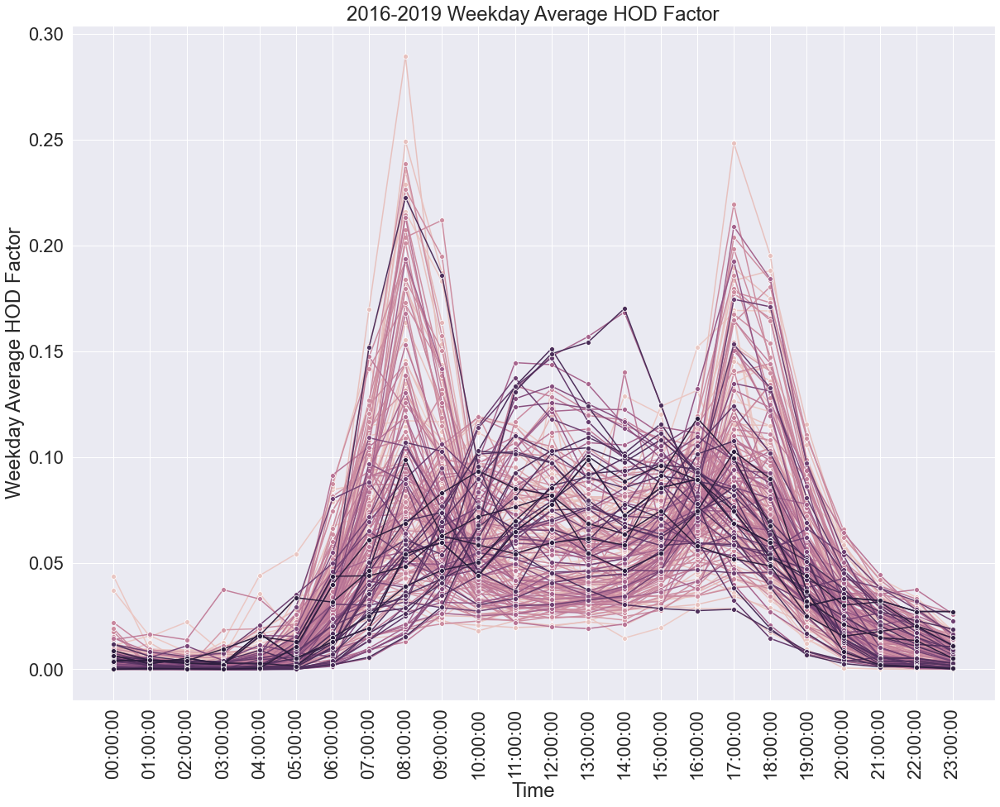

In [292]:
hod_weekday2_ave=pd.DataFrame({'Average_Yearly_HOD_Factor':hod_weekday2.groupby(['ID','starttime'])['HOD'].mean()}).reset_index()
# Combined all 4 years together
sns.set(rc={'figure.figsize':(20,15)})
sns.set(font_scale=2.0)
import seaborn as sns


#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=hod_weekday2_ave['starttime'],y=hod_weekday2_ave['Average_Yearly_HOD_Factor'],hue=hod_weekday2_ave['ID'],
                   markers=True,marker="o", dashes=False,sort=True) 
plt.xticks(rotation = 'vertical')
ax.get_legend().remove()
ax.title.set_text('2016-2019 Weekday Average HOD Factor')
ax.set_ylabel('Weekday Average HOD Factor' )
ax.set_xlabel('Time')
plt.show()

In [293]:
hod_weekday2_ave.groupby(['ID'])['Average_Yearly_HOD_Factor'].sum()

ID
671     1.00
1127    1.00
2415    1.00
2694    1.00
2695    1.00
        ... 
58297   1.00
58298   1.00
59064   1.00
59065   1.00
59066   1.00
Name: Average_Yearly_HOD_Factor, Length: 215, dtype: float64

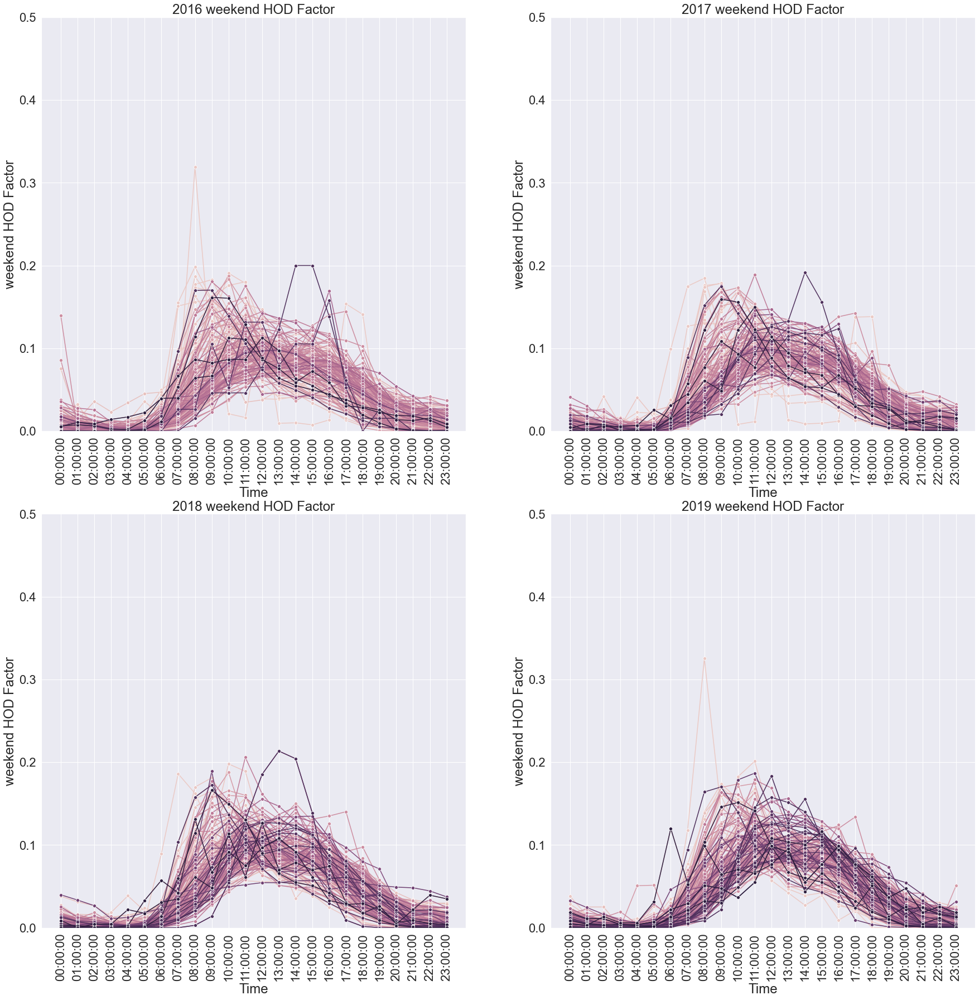

In [294]:
d16=hod_weekend2.loc[hod_weekend2['year']==2016]
d17=hod_weekend2.loc[hod_weekend2['year']==2017]
d18=hod_weekend2.loc[hod_weekend2['year']==2018]
d19=hod_weekend2.loc[hod_weekend2['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['HOD'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['HOD'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['HOD'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['HOD'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.set(ylim=(0, 0.50))
ax2.set(ylim=(0, 0.50))
ax3.set(ylim=(0, 0.50))
ax4.set(ylim=(0, 0.50))
ax1.title.set_text('2016 weekend HOD Factor')
ax2.title.set_text('2017 weekend HOD Factor')
ax3.title.set_text('2018 weekend HOD Factor')
ax4.title.set_text('2019 weekend HOD Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('weekend HOD Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('weekend HOD Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('weekend HOD Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('weekend HOD Factor' )
ax4.set_xlabel('Time')
plt.show()

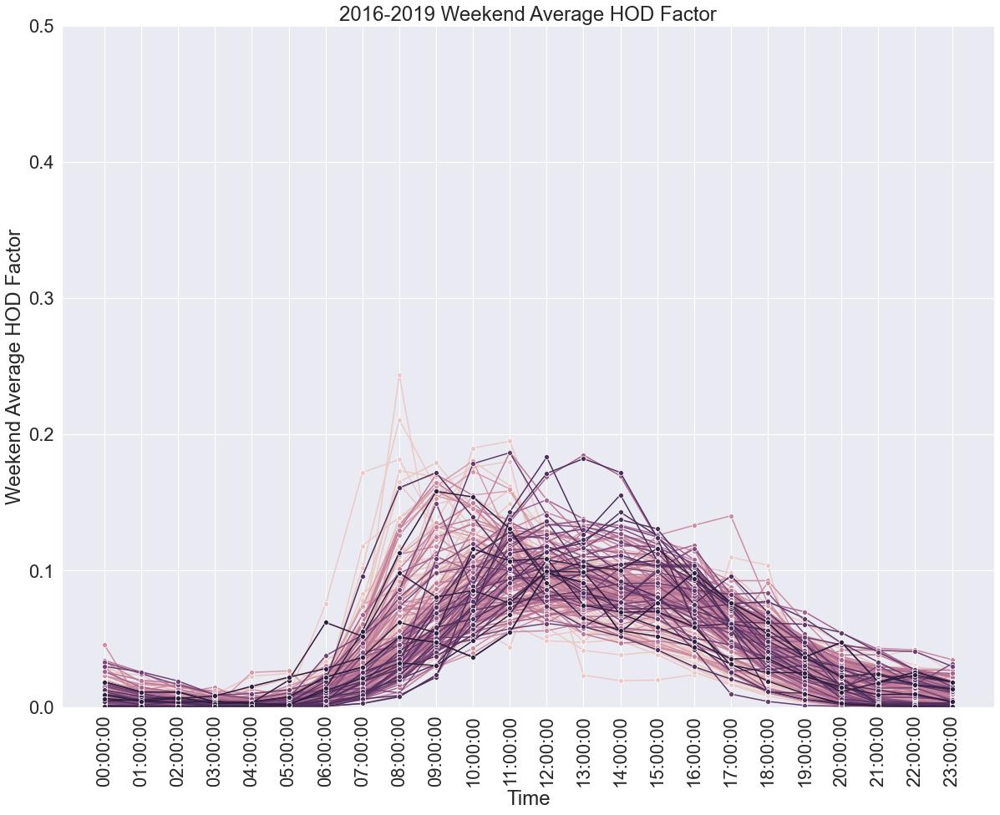

In [295]:
hod_weekend2_ave=pd.DataFrame({'Average_Yearly_HOD_Factor':hod_weekend2.groupby(['ID','starttime'])['HOD'].mean()}).reset_index()
# Combined all 4 years together
sns.set(rc={'figure.figsize':(20,15)})
sns.set(font_scale=2.0)
import seaborn as sns


#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=hod_weekend2_ave['starttime'],y=hod_weekend2_ave['Average_Yearly_HOD_Factor'],hue=hod_weekend2_ave['ID'],
                   markers=True,marker="o", dashes=False,sort=True) 
plt.xticks(rotation = 'vertical')
ax.set(ylim=(0, 0.50))
ax.get_legend().remove()
ax.title.set_text('2016-2019 Weekend Average HOD Factor')
ax.set_ylabel('Weekend Average HOD Factor' )
ax.set_xlabel('Time')
plt.show()

In [296]:
check=hod_weekend2_ave.loc[hod_weekend2_ave['Average_Yearly_HOD_Factor']>0.30]
check

,ID,starttime,Average_Yearly_HOD_Factor


In [297]:
anomally1=city_state1.loc[city_state1['ID']== 50994]
anomally1                  

,ID,year,latitude,longitude,location,road,city,county,state,country
10624392,50994,2016,38.95,-119.96,urban,Lake Tahoe Boulevard,,El Dorado County,California,United States


In [298]:
hod_weekday2_ave.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/four_year_ave_HOD_weekday.csv')
hod_weekend2_ave.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/four_year_ave_HOD_weekend.csv')

# Now Calculate th Average Curve for each of HOD factor Case

In [299]:
doh_weekday_factor_group=pd.DataFrame({'Average_group_HOD_Factor':hod_weekday2.groupby(['year','starttime'])['HOD'].mean()}).reset_index()
doh_weekend_factor_group=pd.DataFrame({'Average_group_HOD_Factor':hod_weekend2.groupby(['year','starttime'])['HOD'].mean()}).reset_index()
doh_weekend_factor_group.head()

,year,starttime,Average_group_HOD_Factor
0,2016,00:00:00,0.01
1,2016,01:00:00,0.01
2,2016,02:00:00,0.00
3,2016,03:00:00,0.00
4,2016,04:00:00,0.00


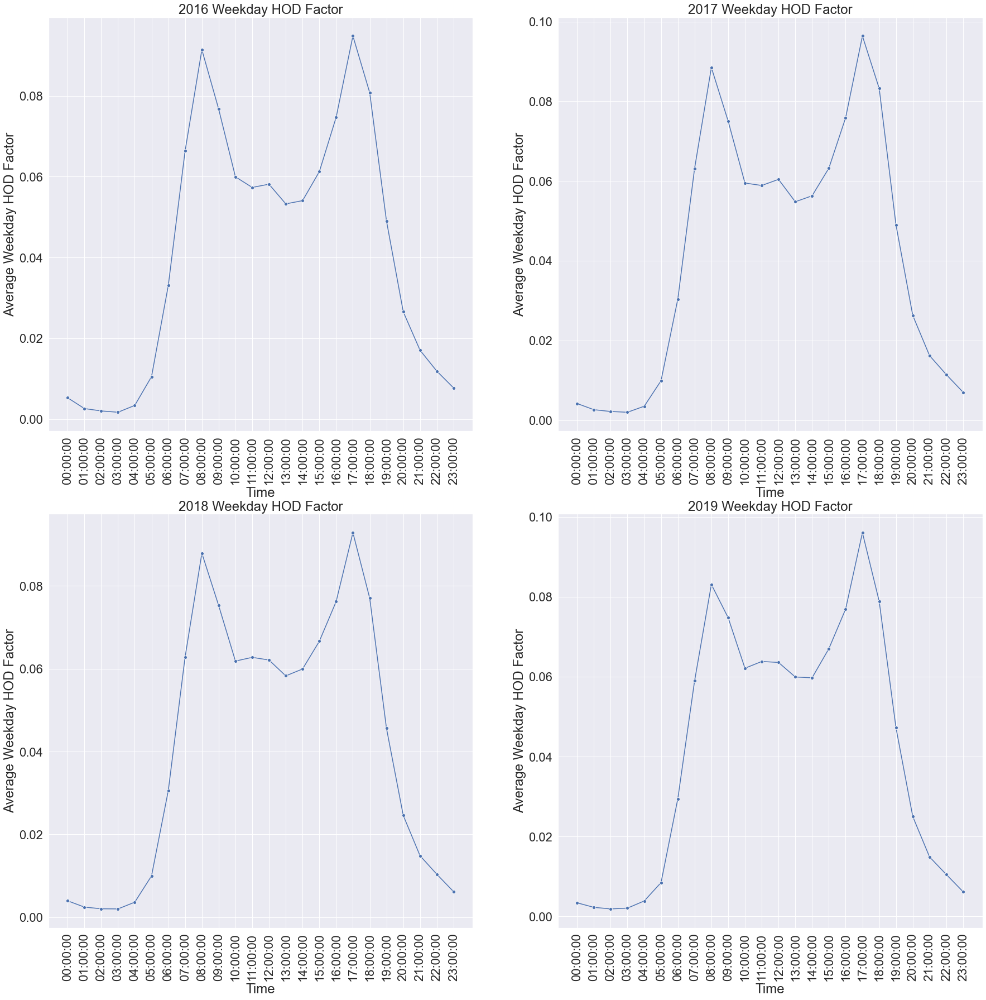

In [300]:
d16=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2016]
d17=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2017]
d18=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2018]
d19=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_group_HOD_Factor'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Weekday HOD Factor')
ax2.title.set_text('2017 Weekday HOD Factor')
ax3.title.set_text('2018 Weekday HOD Factor')
ax4.title.set_text('2019 Weekday HOD Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Average Weekday HOD Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Average Weekday HOD Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Average Weekday HOD Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Average Weekday HOD Factor' )
ax4.set_xlabel('Time')
plt.show()

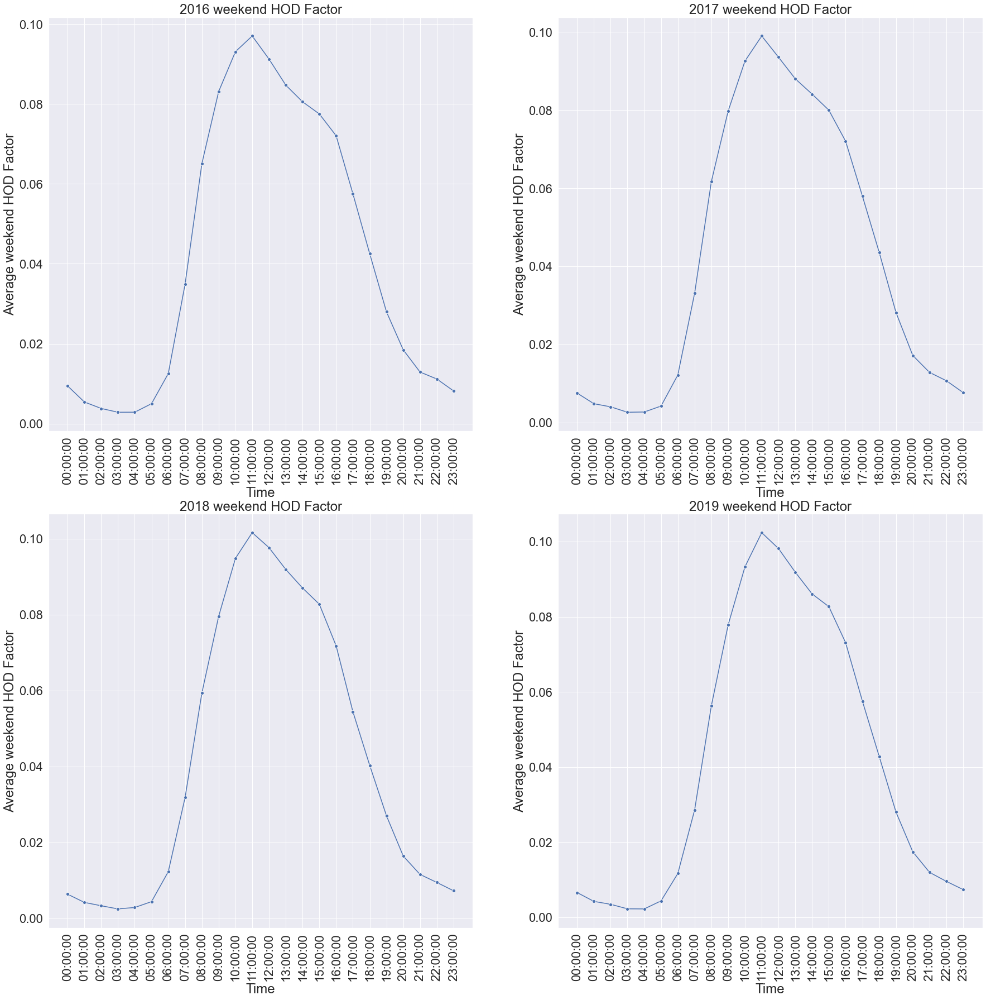

In [301]:
d16=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2016]
d17=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2017]
d18=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2018]
d19=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_group_HOD_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_group_HOD_Factor'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 

ax1.title.set_text('2016 weekend HOD Factor')
ax2.title.set_text('2017 weekend HOD Factor')
ax3.title.set_text('2018 weekend HOD Factor')
ax4.title.set_text('2019 weekend HOD Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Average weekend HOD Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Average weekend HOD Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Average weekend HOD Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Average weekend HOD Factor' )
ax4.set_xlabel('Time')
plt.show()

# Develop DOW Factor 

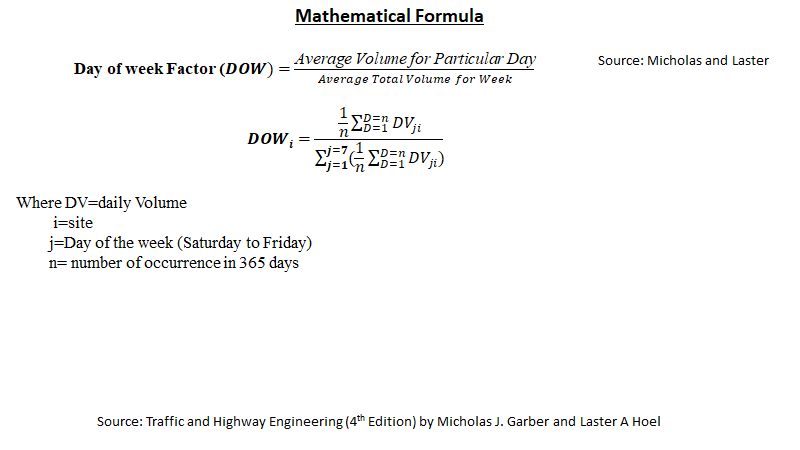

In [302]:
daily_vol10=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/eco_daily_volume_2019_2016_data.csv')
daily_vol110=pd.DataFrame({'daily_Average_volume':daily_vol10.groupby(['ID','year','Day of Week'])['Daily_volume'].mean()}).reset_index()
daily_vol111=pd.DataFrame({'Average_Total_weekly_volume':daily_vol110.groupby(['ID','year'])['daily_Average_volume'].sum()}).reset_index()
daily_vol112=pd.merge(daily_vol110,daily_vol111,left_on=['ID','year'],right_on=['ID','year'],how='inner')
daily_vol112.head()

,ID,year,Day of Week,daily_Average_volume,Average_Total_weekly_volume
0,671,2016,Friday,41.87,374.16
1,671,2016,Monday,43.75,374.16
2,671,2016,Saturday,74.91,374.16
3,671,2016,Sunday,81.21,374.16
4,671,2016,Thursday,49.54,374.16


In [303]:
# import permanent counters
p1=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/permanent_counter_2019_2016_AADBT_data.csv')
# select the permanent counter data only after QA and QC
per_DOW=pd.merge(p1,daily_vol112,left_on=["ID",'year'],right_on=["ID",'year'], how='inner')
per_DOW.head()

,Unnamed: 0,ID,location,latitude,longitude,year,ATT,no_of_months_data_collected,type,Day of Week,daily_Average_volume,Average_Total_weekly_volume
0,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Friday,41.87,374.16
1,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Monday,43.75,374.16
2,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Saturday,74.91,374.16
3,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Sunday,81.21,374.16
4,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Thursday,49.54,374.16


In [304]:
per_DOW.shape,daily_vol110.shape

((4865, 12), (4865, 4))

In [305]:
from pandas.api.types import CategoricalDtype
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)
per_DOW['Day of Week'] = per_DOW['Day of Week'].astype(cat_type)

In [306]:
# Calculate the Hour of day Factor
per_DOW['DOW']=per_DOW['daily_Average_volume']/per_DOW['Average_Total_weekly_volume']
#DOW_data=DOW_data.sort_values(by=['Day of Week'])
#DOW_data_urban=DOW_data.loc[DOW_data['location']=='urban']
#DOW_data_rural=DOW_data.loc[DOW_data['location']=='rural']
per_DOW.head()

,Unnamed: 0,ID,location,latitude,longitude,year,ATT,no_of_months_data_collected,type,Day of Week,daily_Average_volume,Average_Total_weekly_volume,DOW
0,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Friday,41.87,374.16,0.11
1,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Monday,43.75,374.16,0.12
2,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Saturday,74.91,374.16,0.20
3,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Sunday,81.21,374.16,0.22
4,0,671,urban,37.79,-122.46,2016,19573.00,12,eco_permanent,Thursday,49.54,374.16,0.13


In [307]:
per_DOW.groupby(['ID','year'])['DOW'].sum()

ID     year
671    2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
1127   2016   1.00
              ... 
59065  2018   1.00
59066  2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
Name: DOW, Length: 695, dtype: float64

In [308]:
DOW=per_DOW

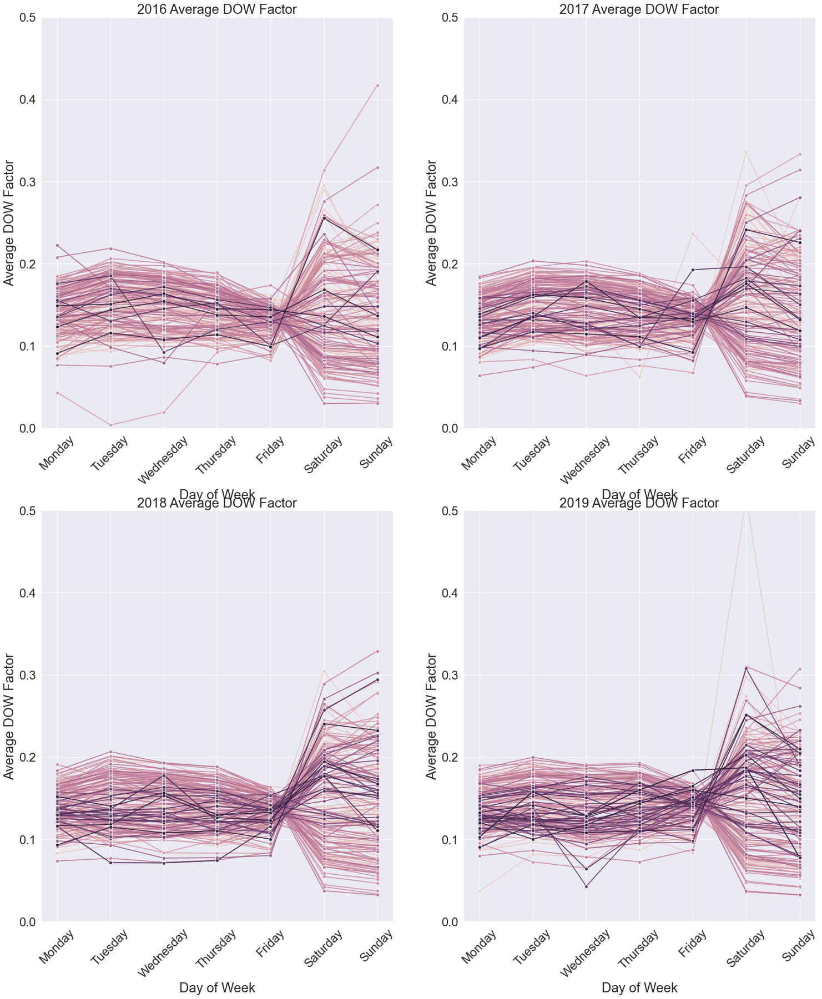

In [309]:
d16=DOW.loc[DOW['year']==2016]
d17=DOW.loc[DOW['year']==2017]
d18=DOW.loc[DOW['year']==2018]
d19=DOW.loc[DOW['year']==2019]

sns.set(rc={'figure.figsize':(25,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['Day of Week'],y=d16['DOW'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['Day of Week'],y=d17['DOW'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['Day of Week'],y=d18['DOW'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['Day of Week'],y=d19['DOW'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.set(ylim=(0, 0.50))
ax2.set(ylim=(0, 0.50))
ax3.set(ylim=(0, 0.50))
ax4.set(ylim=(0, 0.50))
ax1.title.set_text('2016 Average DOW Factor')
ax2.title.set_text('2017 Average DOW Factor')
ax3.title.set_text('2018 Average DOW Factor')
ax4.title.set_text('2019 Average DOW Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)
ax1.set_ylabel('Average DOW Factor' )
ax1.set_xlabel('Day of Week')
ax2.set_ylabel('Average DOW Factor' )
ax2.set_xlabel('Day of Week')
ax3.set_ylabel('Average DOW Factor' )
ax3.set_xlabel('Day of Week')
ax4.set_ylabel('Average DOW Factor' )
ax4.set_xlabel('Day of Week')
plt.show()

In [310]:
DOW.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/DOW.csv')

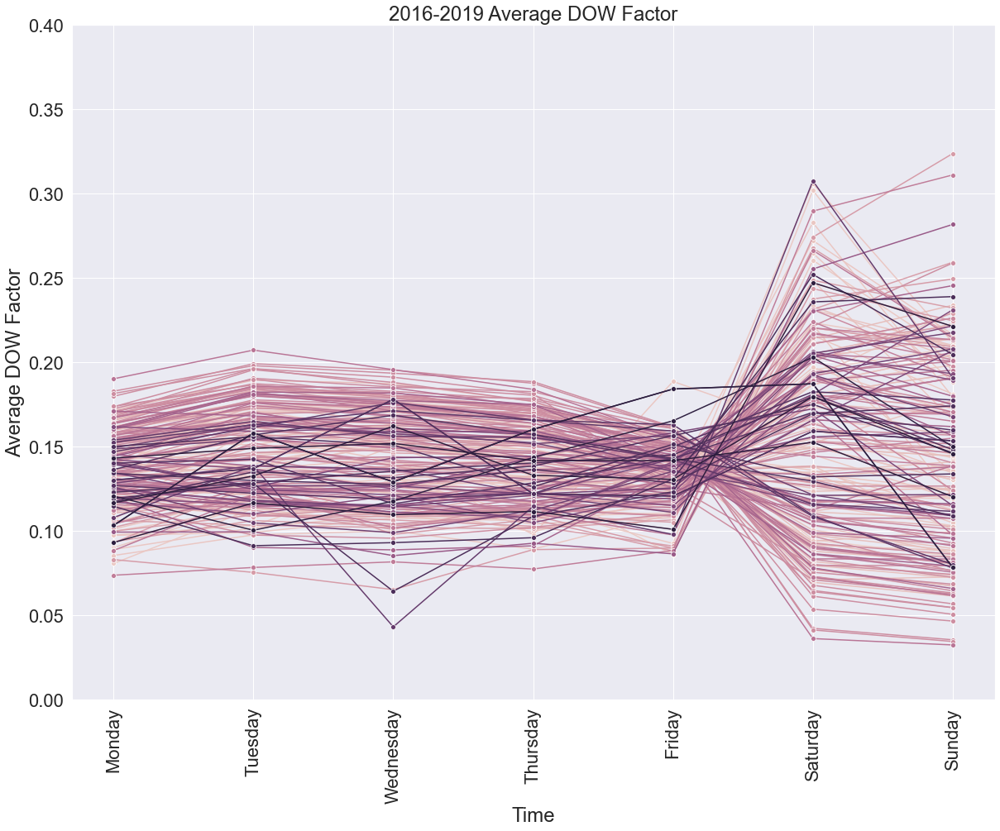

In [311]:
# Combined 4 years together
DOW_ave=pd.DataFrame({'Average_Yearly_DOW_Factor':DOW.groupby(['ID','Day of Week'])['DOW'].mean()}).reset_index()
# Combined all 4 years together
sns.set(rc={'figure.figsize':(20,15)})
sns.set(font_scale=2.0)
import seaborn as sns


#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=DOW_ave['Day of Week'],y=DOW_ave['Average_Yearly_DOW_Factor'],hue=DOW_ave['ID'],
                   markers=True,marker="o", dashes=False,sort=True) 
plt.xticks(rotation = 'vertical')
ax.set(ylim=(0, 0.40))
ax.get_legend().remove()
ax.title.set_text('2016-2019 Average DOW Factor')
ax.set_ylabel('Average DOW Factor' )
ax.set_xlabel('Time')
plt.show()

In [312]:
DOW_ave.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/four_year_ave_DOW.csv')

In [313]:
DOW_group=pd.DataFrame({'Average group DOW':DOW.groupby(['year','Day of Week'])['DOW'].mean()}).reset_index()

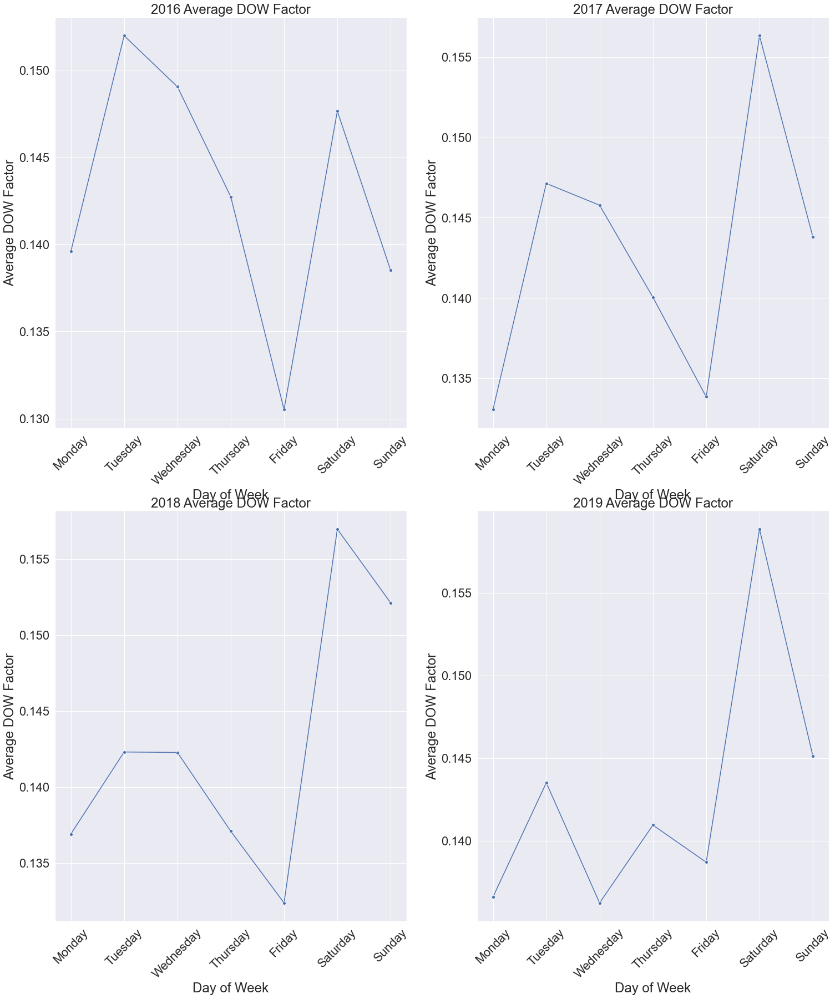

In [314]:
d16=DOW_group.loc[DOW_group['year']==2016]
d17=DOW_group.loc[DOW_group['year']==2017]
d18=DOW_group.loc[DOW_group['year']==2018]
d19=DOW_group.loc[DOW_group['year']==2019]

sns.set(rc={'figure.figsize':(25,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['Day of Week'],y=d16['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['Day of Week'],y=d17['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['Day of Week'],y=d18['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['Day of Week'],y=d19['Average group DOW'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Average DOW Factor')
ax2.title.set_text('2017 Average DOW Factor')
ax3.title.set_text('2018 Average DOW Factor')
ax4.title.set_text('2019 Average DOW Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)
ax1.set_ylabel('Average DOW Factor' )
ax1.set_xlabel('Day of Week')
ax2.set_ylabel('Average DOW Factor' )
ax2.set_xlabel('Day of Week')
ax3.set_ylabel('Average DOW Factor' )
ax3.set_xlabel('Day of Week')
ax4.set_ylabel('Average DOW Factor' )
ax4.set_xlabel('Day of Week')
plt.show()

# MOY Factor

In [315]:
dv1=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/eco_daily_volume_2019_2016_data.csv')

In [347]:
p1=pd.read_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/permanent_counter_2019_2016_AADBT_data.csv')
p2=p1.loc[p1['no_of_months_data_collected']>=11]
p2.shape

(447, 9)

In [348]:
dv2=pd.merge(dv1,p2, left_on=["ID",'year'],right_on=["ID",'year'], how='inner')
dv2.head()

,Unnamed: 0_x,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,date,days_in_month,no_of_days_data_collected,Unnamed: 0_y,location,latitude,longitude,ATT,no_of_months_data_collected,type
0,0,671,2016,1,1,Friday,53,56.00,24,56.00,...,2016-01-01,31,31,0,urban,37.79,-122.46,19573.00,12,eco_permanent
1,1,671,2016,1,2,Saturday,53,65.00,24,121.00,...,2016-01-02,31,31,0,urban,37.79,-122.46,19573.00,12,eco_permanent
2,2,671,2016,1,3,Sunday,53,60.00,24,181.00,...,2016-01-03,31,31,0,urban,37.79,-122.46,19573.00,12,eco_permanent
3,3,671,2016,1,4,Monday,1,12.00,24,193.00,...,2016-01-04,31,31,0,urban,37.79,-122.46,19573.00,12,eco_permanent
4,4,671,2016,1,5,Tuesday,1,18.00,24,211.00,...,2016-01-05,31,31,0,urban,37.79,-122.46,19573.00,12,eco_permanent


In [349]:
# dv3=pd.DataFrame({'ADT':dv2.groupby(['ID','year','month','Day of Week'])['Daily_volume'].mean()}).reset_index()
# dv4=pd.DataFrame({'MADT':dv3.groupby(['ID','year','month'])['ADT'].mean()}).reset_index()
# dv5=pd.DataFrame({'AADBT':dv4.groupby(['ID','year'])['MADT'].mean()}).reset_index()
# dv6=pd.merge(dv4, dv5, left_on=['ID','year'], right_on=['ID','year'], how='inner')
# dv6['MOY']=dv6['MADT']/dv6['AADBT']
# dv6.head()

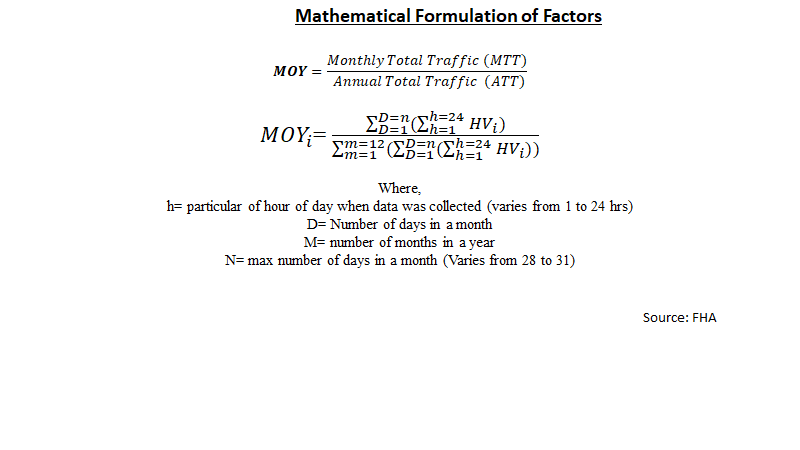

In [350]:
dv3=pd.DataFrame({'MTT':dv2.groupby(['ID','year','month'])['Daily_volume'].sum()}).reset_index()
dv4=pd.DataFrame({'ATT':dv3.groupby(['ID','year'])['MTT'].sum()}).reset_index()
#dv5=pd.DataFrame({'AADBT':dv4.groupby(['ID','year'])['MADT'].mean()}).reset_index()
dv6=pd.merge(dv3, dv4, left_on=['ID','year'], right_on=['ID','year'], how='inner')
dv6['MOY']=dv6['MTT']/dv6['ATT']
dv6.head()

,ID,year,month,MTT,ATT,MOY
0,671,2016,1,1243.00,19573.00,0.06
1,671,2016,2,1496.00,19573.00,0.08
2,671,2016,3,1445.00,19573.00,0.07
3,671,2016,4,1793.00,19573.00,0.09
4,671,2016,5,2013.00,19573.00,0.10


In [351]:
#dv1.loc[dv1['ID']==51027]
p2.loc[p2['ID']==44181]

,Unnamed: 0,ID,location,latitude,longitude,year,ATT,no_of_months_data_collected,type


In [352]:
dv2.groupby(['ID','year','month','Day of Week'])['Daily_volume'].count()

ID     year  month  Day of Week
671    2016  1      Friday         5
                    Monday         4
                    Saturday       5
                    Sunday         5
                    Thursday       4
                                  ..
59066  2018  12     Saturday       4
                    Sunday         4
                    Thursday       2
                    Tuesday        3
                    Wednesday      2
Name: Daily_volume, Length: 37204, dtype: int64

In [353]:
dv6.groupby(['ID','year'])['MOY'].sum()

ID     year
671    2016   1.00
       2017   1.00
       2018   1.00
       2019   1.00
1127   2016   1.00
              ... 
59064  2017   1.00
       2018   1.00
59065  2016   1.00
59066  2016   1.00
       2018   1.00
Name: MOY, Length: 447, dtype: float64

In [354]:
dv2.groupby(['ID','year','month','weekno'])['Daily_volume'].count()

ID     year  month  weekno
671    2016  1      1         7
                    2         7
                    3         7
                    4         7
                    53        3
                             ..
59066  2018  12     48        2
                    49        7
                    50        7
                    51        2
                    52        2
Name: Daily_volume, Length: 27649, dtype: int64

In [355]:
dv2.groupby(['ID','year','weekno','month'])['Daily_volume'].count()

ID     year  weekno  month
671    2016  1       1        7
             2       1        7
             3       1        7
             4       1        7
             5       2        7
                             ..
59066  2018  48      12       2
             49      12       7
             50      12       7
             51      12       2
             52      12       2
Name: Daily_volume, Length: 27649, dtype: int64

In [356]:
dv3.shape,dv4.shape

((5315, 4), (447, 3))

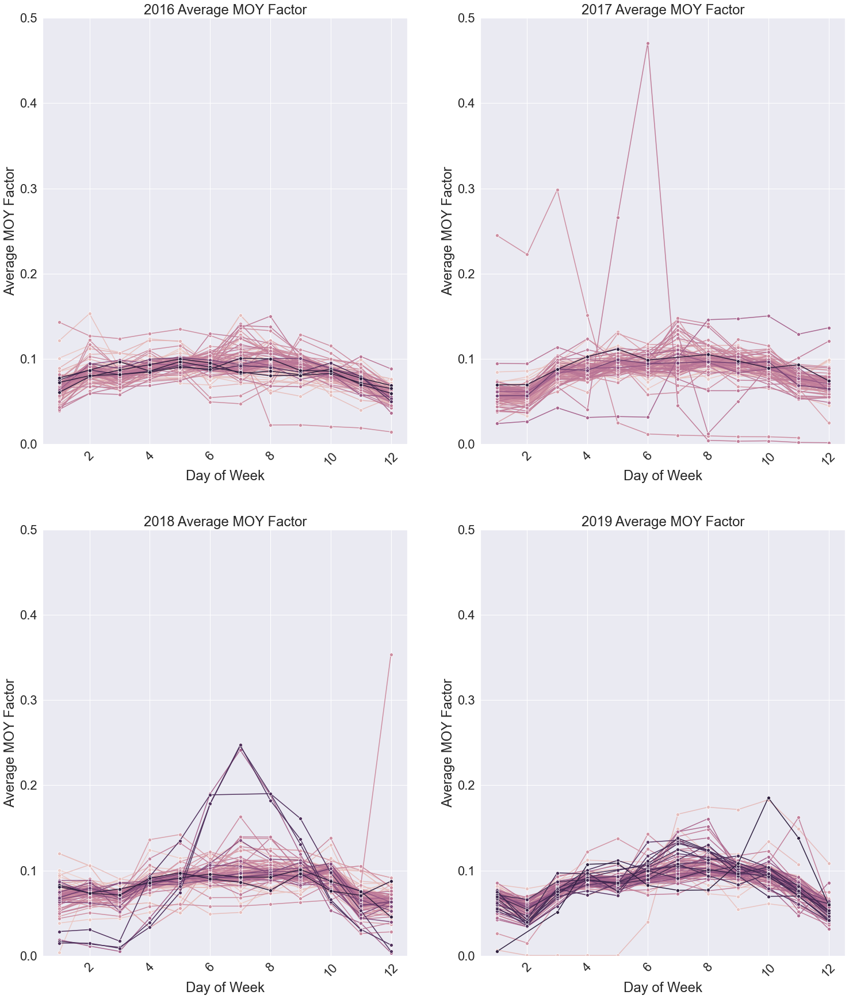

In [357]:
d16=dv6.loc[dv6['year']==2016]
d17=dv6.loc[dv6['year']==2017]
d18=dv6.loc[dv6['year']==2018]
d19=dv6.loc[dv6['year']==2019]

sns.set(rc={'figure.figsize':(25,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['month'],y=d16['MOY'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['month'],y=d17['MOY'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['month'],y=d18['MOY'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['month'],y=d19['MOY'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.set(ylim=(0, 0.50))
ax2.set(ylim=(0, 0.50))
ax3.set(ylim=(0, 0.50))
ax4.set(ylim=(0, 0.50))
ax1.title.set_text('2016 Average MOY Factor')
ax2.title.set_text('2017 Average MOY Factor')
ax3.title.set_text('2018 Average MOY Factor')
ax4.title.set_text('2019 Average MOY Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)
ax1.set_ylabel('Average MOY Factor' )
ax1.set_xlabel('Day of Week')
ax2.set_ylabel('Average MOY Factor' )
ax2.set_xlabel('Day of Week')
ax3.set_ylabel('Average MOY Factor' )
ax3.set_xlabel('Day of Week')
ax4.set_ylabel('Average MOY Factor' )
ax4.set_xlabel('Day of Week')
plt.show()

In [358]:
dv6.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/MOY.csv')

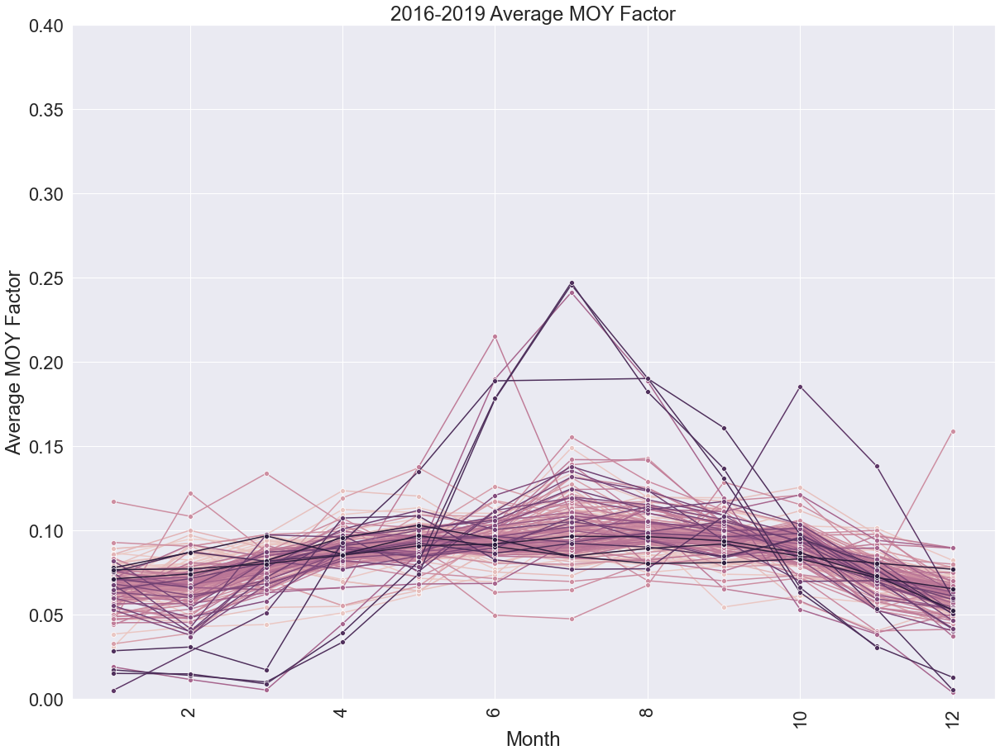

In [359]:
# Combine all 4 years factor together as average MOY
# Combined 4 years together
MOY_ave=pd.DataFrame({'Average_Yearly_MOY_Factor':dv6.groupby(['ID','month'])['MOY'].mean()}).reset_index()
# Combined all 4 years together
sns.set(rc={'figure.figsize':(20,15)})
sns.set(font_scale=2.0)
import seaborn as sns


#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=MOY_ave['month'],y=MOY_ave['Average_Yearly_MOY_Factor'],hue=MOY_ave['ID'],
                   markers=True,marker="o", dashes=False,sort=True) 
plt.xticks(rotation = 'vertical')
ax.set(ylim=(0, 0.40))
ax.get_legend().remove()
ax.title.set_text('2016-2019 Average MOY Factor')
ax.set_ylabel('Average MOY Factor' )
ax.set_xlabel('Month')
plt.show()

In [360]:
check=MOY_ave.loc[MOY_ave['Average_Yearly_MOY_Factor']>0.25]
check

,ID,month,Average_Yearly_MOY_Factor


In [361]:
anomally1=city_state1['ID'].isin([30665,50992,50993])
city_state1[anomally1]    

,ID,year,latitude,longitude,location,road,city,county,state,country
7924464,30665,2016,38.98,-119.94,rural,Lam Watah Historic Trail,,Douglas County,Nevada,United States
10554264,50992,2016,38.95,-119.96,urban,Lake Tahoe Boulevard,,El Dorado County,California,United States
10589328,50993,2016,38.93,-119.98,urban,El Dorado/ Harrison Bike,,El Dorado County,California,United States


In [362]:
MOY_ave.to_csv('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Processed Data/four_year_ave_MOY.csv')

# End of the Coding